In [1]:
!pip install -q torchinfo torch

In [2]:
import os
import random
import numpy as np
from collections import defaultdict
from pathlib import Path

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader, random_split, Subset
from torchvision import transforms

from PIL import Image
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import seaborn as sns
from tqdm.auto import tqdm
from scipy import linalg
import pandas as pd

from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import (
    silhouette_score, adjusted_rand_score,
    accuracy_score, precision_score, recall_score, f1_score,
    confusion_matrix, classification_report
)
from sklearn.preprocessing import LabelEncoder

import warnings
warnings.filterwarnings('ignore')

plt.rcParams['figure.figsize'] = (12, 8)
plt.rcParams['figure.dpi'] = 100
sns.set_style('darkgrid')

print("All libraries imported!")

All libraries imported!


In [3]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [4]:
DRIVE_PROJECT_DIR = '/content/drive/MyDrive/Colab_Notebooks/VAE/vae_fingerprints'
print(f"Drive project directory: {DRIVE_PROJECT_DIR}")


Drive project directory: /content/drive/MyDrive/Colab_Notebooks/VAE/vae_fingerprints


In [6]:
class Config:
    DATASET_ROOT = './dataset'
    REAL_DIR = os.path.join(DATASET_ROOT, 'Real')
    ALTERED_DIR = os.path.join(DATASET_ROOT, 'Altered')
    CHECKPOINT_DIR = os.path.join(DRIVE_PROJECT_DIR, 'checkpoints')
    RESULTS_DIR = os.path.join(DRIVE_PROJECT_DIR, 'results')
    IMG_SIZE = 128
    IMG_CHANNELS = 1
    LATENT_DIM = 256
    ENCODER_CHANNELS = [32, 64, 128, 256, 512]
    DECODER_CHANNELS = [512, 256, 128, 64, 32]
    BATCH_SIZE = 64
    SEED = 42
    LEARNING_RATE = 5e-4

In [7]:
config = Config()
os.makedirs(config.RESULTS_DIR, exist_ok=True)
print(f"Checkpoints: {config.CHECKPOINT_DIR}")
print(f"Results:     {config.RESULTS_DIR}")

Checkpoints: /content/drive/MyDrive/Colab_Notebooks/VAE/vae_fingerprints/checkpoints
Results:     /content/drive/MyDrive/Colab_Notebooks/VAE/vae_fingerprints/results


In [8]:
def save_figure_with_description(fig, save_path, description):
    """
    Save a matplotlib figure AND a companion .txt file with a description.
    The .txt file has the same name as the image but with _description.txt suffix.
    This makes the results folder self-documenting for presentations.
    """
    if save_path is None:
        return
    fig.savefig(save_path, dpi=150, bbox_inches='tight')
    desc_path = save_path.rsplit('.', 1)[0] + '_description.txt'
    with open(desc_path, 'w', encoding='utf-8') as f:
        f.write(description)
    print(f"Saved: {os.path.basename(save_path)}")
    print(f"Description: {os.path.basename(desc_path)}")


In [9]:
# Device setup
def setup_device():
    if torch.cuda.is_available():
        device = torch.device('cuda')
        print(f"Using GPU: {torch.cuda.get_device_name(0)}")
        return device
    print("Using CPU")
    return torch.device('cpu')


In [10]:
DEVICE = setup_device()

Using GPU: Tesla T4


In [11]:
# Set seeds
random.seed(config.SEED)
np.random.seed(config.SEED)
torch.manual_seed(config.SEED)

In [12]:
class Encoder(nn.Module):
    def __init__(self, in_channels=1, latent_dim=128, channels=[32, 64, 128, 256, 512]):
        super().__init__()
        layers = []
        prev_ch = in_channels
        for ch in channels:
            layers.extend([
                nn.Conv2d(prev_ch, ch, 4, 2, 1, bias=False),
                nn.BatchNorm2d(ch),
                nn.LeakyReLU(0.2, inplace=True),
            ])
            prev_ch = ch
        self.conv_layers = nn.Sequential(*layers)
        self.flatten_size = channels[-1] * 4 * 4
        self.fc_mu = nn.Linear(self.flatten_size, latent_dim)
        self.fc_logvar = nn.Linear(self.flatten_size, latent_dim)

    def forward(self, x):
        h = self.conv_layers(x)
        h = h.view(h.size(0), -1)
        return self.fc_mu(h), self.fc_logvar(h)


In [13]:
class Decoder(nn.Module):
    def __init__(self, latent_dim=128, out_channels=1, channels=[512, 256, 128, 64, 32]):
        super().__init__()
        self.initial_channels = channels[0]
        self.fc = nn.Linear(latent_dim, channels[0] * 4 * 4)
        layers = []
        for i in range(len(channels) - 1):
            layers.extend([
                nn.ConvTranspose2d(channels[i], channels[i+1], 4, 2, 1, bias=False),
                nn.BatchNorm2d(channels[i+1]),
                nn.ReLU(inplace=True),
            ])
        layers.extend([
            nn.ConvTranspose2d(channels[-1], out_channels, 4, 2, 1, bias=False),
            nn.Sigmoid()
        ])
        self.deconv_layers = nn.Sequential(*layers)

    def forward(self, z):
        h = self.fc(z)
        h = h.view(h.size(0), self.initial_channels, 4, 4)
        return self.deconv_layers(h)


In [14]:
class VAE(nn.Module):
    def __init__(self, in_channels=1, latent_dim=128,
                 encoder_channels=[32, 64, 128, 256, 512],
                 decoder_channels=[512, 256, 128, 64, 32]):
        super().__init__()
        self.latent_dim = latent_dim
        self.encoder = Encoder(in_channels, latent_dim, encoder_channels)
        self.decoder = Decoder(latent_dim, in_channels, decoder_channels)

    def reparameterize(self, mu, logvar):
        std = torch.exp(0.5 * logvar)
        eps = torch.randn_like(std)
        return mu + std * eps

    def forward(self, x):
        mu, logvar = self.encoder(x)
        z = self.reparameterize(mu, logvar)
        return self.decoder(z), mu, logvar

    def encode(self, x):
        mu, _ = self.encoder(x)
        return mu

    def decode(self, z):
        return self.decoder(z)

    def sample(self, num_samples, device):
        z = torch.randn(num_samples, self.latent_dim).to(device)
        return self.decoder(z)


In [15]:
class SOCOFingDataset(Dataset):
    def __init__(self, root_dir, transform=None, subset='Real'):
        self.transform = transform
        self.image_paths = []
        self.metadata = []
        if subset == 'Real':
            self._load_dir(root_dir)
        print(f"   Loaded {len(self.image_paths)} images")

    def _parse_filename(self, filename):
        name = os.path.splitext(filename)[0]
        parts = name.split('_')
        meta = {'subject_id': -1, 'gender': 'Unknown', 'hand': 'Unknown', 'finger': 'Unknown'}
        try:
            meta['subject_id'] = int(parts[0])
            for i, p in enumerate(parts):
                if p in ('M', 'F'):
                    meta['gender'] = p
                    if i + 1 < len(parts): meta['hand'] = parts[i + 1]
                    if i + 2 < len(parts): meta['finger'] = parts[i + 2]
                    break
        except: pass
        return meta

    def _load_dir(self, directory):
        valid_ext = ('.bmp', '.BMP', '.png', '.PNG', '.jpg', '.JPG')
        for fname in sorted(os.listdir(directory)):
            if fname.endswith(valid_ext):
                self.image_paths.append(os.path.join(directory, fname))
                meta = self._parse_filename(fname)
                meta['source'] = 'Real'
                self.metadata.append(meta)

    def __len__(self): return len(self.image_paths)

    def __getitem__(self, idx):
        try: image = Image.open(self.image_paths[idx]).convert('L')
        except: image = Image.new('L', (config.IMG_SIZE, config.IMG_SIZE), 128)
        if self.transform: image = self.transform(image)
        return image, self.metadata[idx]


In [16]:
def download_and_extract_dataset(dest_dir='./dataset'):
    real_dir = os.path.join(dest_dir, 'Real')
    if os.path.isdir(real_dir) and len(os.listdir(real_dir)) > 100:
        print(f"Dataset already exists at {dest_dir} ({len(os.listdir(real_dir))} files)")
        return
    print("📥 Downloading SOCOFing dataset...")
    os.makedirs(dest_dir, exist_ok=True)
    try:
        import subprocess
        subprocess.run(['pip', 'install', '-q', 'kaggle'], check=True)
        kaggle_dir = os.path.expanduser('~/.kaggle')
        os.makedirs(kaggle_dir, exist_ok=True)
        subprocess.run(['kaggle', 'datasets', 'download', '-d', 'ruizgara/socofing',
                        '-p', dest_dir, '--unzip'], check=True)
        nested = os.path.join(dest_dir, 'SOCOFing')
        if os.path.isdir(nested):
            for item in os.listdir(nested):
                src, dst = os.path.join(nested, item), os.path.join(dest_dir, item)
                if not os.path.exists(dst): os.rename(src, dst)
        print("Dataset downloaded via Kaggle!")
        return
    except Exception as e:
        print(f"   Kaggle failed ({e}), trying gdown...")
    try:
        subprocess.run(['pip', 'install', '-q', 'gdown'], check=True)
        import gdown, zipfile
        url = 'https://drive.google.com/uc?id=1VG3yL1M-cQpIF7WRXZ3KJcaaqBb9Cxya'
        zip_path = os.path.join(dest_dir, 'SOCOFing.zip')
        gdown.download(url, zip_path, quiet=False)
        with zipfile.ZipFile(zip_path, 'r') as z: z.extractall(dest_dir)
        os.remove(zip_path)
        nested = os.path.join(dest_dir, 'SOCOFing')
        if os.path.isdir(nested):
            for item in os.listdir(nested):
                src, dst = os.path.join(nested, item), os.path.join(dest_dir, item)
                if not os.path.exists(dst): os.rename(src, dst)
        print("Dataset downloaded via gdown!")
    except Exception as e:
        print(f"Auto-download failed: {e}")
        print("Please upload SOCOFing to ./dataset/Real/")

In [17]:
download_and_extract_dataset('./dataset')

📥 Downloading SOCOFing dataset...
Dataset downloaded via Kaggle!


In [18]:
model = VAE(config.IMG_CHANNELS, config.LATENT_DIM,
            config.ENCODER_CHANNELS, config.DECODER_CHANNELS).to(DEVICE)

In [19]:
best_path = os.path.join(config.CHECKPOINT_DIR, 'vae_best.pt')
ckpt = torch.load(best_path, map_location=DEVICE, weights_only=False)
model.load_state_dict(ckpt['model_state_dict'])
model.eval()
print(f"Best model loaded from Drive (epoch {ckpt['epoch']}, val_loss: {ckpt['best_val_loss']:.4f})")

Best model loaded from Drive (epoch 200, val_loss: 2928.5510)


In [20]:
val_transform = transforms.Compose([
    transforms.Resize((config.IMG_SIZE, config.IMG_SIZE)),
    transforms.ToTensor(),
])

In [21]:
dataset = SOCOFingDataset(config.REAL_DIR, transform=val_transform, subset='Real')
total = len(dataset)

   Loaded 6000 images


In [22]:
split_path = os.path.join(config.CHECKPOINT_DIR, 'data_split_indices.pt')
if os.path.exists(split_path):
    split_info = torch.load(split_path, weights_only=False)
    train_dataset = Subset(dataset, split_info['train_indices'])
    val_dataset = Subset(dataset, split_info['val_indices'])
    test_dataset = Subset(dataset, split_info['test_indices'])
    print(f"Loaded split indices from Drive")
    print(f"Train: {len(train_dataset)} | Val: {len(val_dataset)} | Test: {len(test_dataset)}")
else:
    # Fallback: recreate split with same seed
    train_size = int(0.80 * total)
    val_size = int(0.10 * total)
    test_size = total - train_size - val_size
    train_dataset, val_dataset, test_dataset = random_split(
        dataset, [train_size, val_size, test_size],
        generator=torch.Generator().manual_seed(config.SEED))
    print(f"Split indices not found, recreated from seed")
    print(f"Train: {train_size} | Val: {val_size} | Test: {test_size}")

Loaded split indices from Drive
Train: 4800 | Val: 600 | Test: 600


In [23]:
full_loader = DataLoader(dataset, batch_size=config.BATCH_SIZE, shuffle=False)
val_loader = DataLoader(val_dataset, batch_size=config.BATCH_SIZE, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=config.BATCH_SIZE, shuffle=False)

print(f"Data loaded: {total} total, {len(val_dataset)} val, {len(test_dataset)} test")

Data loaded: 6000 total, 600 val, 600 test


In [24]:
def compute_ssim(img1, img2, window_size=11, C1=0.01**2, C2=0.03**2):
    """
    Structural Similarity Index (SSIM) — implemented from scratch.
    Measures structural similarity between original and reconstructed images.

    SSIM(x, y) = (2*μx*μy + C1)(2*σxy + C2) / ((μx² + μy² + C1)(σx² + σy² + C2))
    """
    # Create gaussian window
    def gaussian_window(size, sigma=1.5):
        coords = torch.arange(size, dtype=torch.float32) - size // 2
        g = torch.exp(-(coords ** 2) / (2 * sigma ** 2))
        g = g / g.sum()
        return g.unsqueeze(0) * g.unsqueeze(1)

    window = gaussian_window(window_size).unsqueeze(0).unsqueeze(0).to(img1.device)
    channels = img1.size(1)
    window = window.expand(channels, -1, -1, -1)
    padding = window_size // 2

    mu1 = F.conv2d(img1, window, padding=padding, groups=channels)
    mu2 = F.conv2d(img2, window, padding=padding, groups=channels)

    mu1_sq = mu1.pow(2)
    mu2_sq = mu2.pow(2)
    mu1_mu2 = mu1 * mu2

    sigma1_sq = F.conv2d(img1 * img1, window, padding=padding, groups=channels) - mu1_sq
    sigma2_sq = F.conv2d(img2 * img2, window, padding=padding, groups=channels) - mu2_sq
    sigma12 = F.conv2d(img1 * img2, window, padding=padding, groups=channels) - mu1_mu2

    ssim_map = ((2 * mu1_mu2 + C1) * (2 * sigma12 + C2)) / \
               ((mu1_sq + mu2_sq + C1) * (sigma1_sq + sigma2_sq + C2))

    return ssim_map.mean().item()


In [25]:
def compute_psnr(img1, img2, max_val=1.0):
    """
    Peak Signal-to-Noise Ratio (PSNR) — implemented from scratch.
    PSNR = 10 * log10(MAX² / MSE)
    Higher is better. Typical range: 20-40 dB for good reconstructions.
    """
    mse = F.mse_loss(img1, img2).item()
    if mse == 0:
        return float('inf')
    return 10 * np.log10(max_val ** 2 / mse)


In [26]:
def compute_mse(img1, img2):
    """Mean Squared Error"""
    return F.mse_loss(img1, img2).item()

In [27]:
@torch.no_grad()
def evaluate_reconstruction_metrics(model, data_loader, device):
    """Compute comprehensive reconstruction metrics over the dataset"""
    model.eval()

    all_ssim = []
    all_psnr = []
    all_mse = []
    all_bce = []
    total_kl = 0
    num_samples = 0

    print("📊 Computing reconstruction metrics...")
    for images, _ in tqdm(data_loader, desc="Evaluating"):
        images = images.to(device)
        recon, mu, logvar = model(images)

        # Per-image metrics
        for i in range(images.size(0)):
            orig = images[i:i+1]
            rec = recon[i:i+1]

            all_ssim.append(compute_ssim(orig, rec))
            all_psnr.append(compute_psnr(orig, rec))
            all_mse.append(compute_mse(orig, rec))
            all_bce.append(F.binary_cross_entropy(rec, orig).item())

        # KL per batch
        kl = -0.5 * torch.sum(1 + logvar - mu.pow(2) - logvar.exp()).item()
        total_kl += kl
        num_samples += images.size(0)

    metrics = {
        'SSIM': {'mean': np.mean(all_ssim), 'std': np.std(all_ssim)},
        'PSNR (dB)': {'mean': np.mean(all_psnr), 'std': np.std(all_psnr)},
        'MSE': {'mean': np.mean(all_mse), 'std': np.std(all_mse)},
        'BCE': {'mean': np.mean(all_bce), 'std': np.std(all_bce)},
        'KL Divergence': {'mean': total_kl / num_samples, 'std': 0},
    }

    # Print results table
    print("\n" + "=" * 60)
    print("RECONSTRUCTION QUALITY METRICS")
    print("=" * 60)
    print(f"{'Metric':<20} {'Mean':>12} {'Std':>12}")
    print("-" * 44)
    for name, vals in metrics.items():
        print(f"{name:<20} {vals['mean']:>12.4f} {vals['std']:>12.4f}")
    print("=" * 60)

    return metrics, all_ssim, all_psnr

In [28]:
metrics, all_ssim, all_psnr = evaluate_reconstruction_metrics(model, val_loader, DEVICE)

📊 Computing reconstruction metrics...


Evaluating:   0%|          | 0/10 [00:00<?, ?it/s]


RECONSTRUCTION QUALITY METRICS
Metric                       Mean          Std
--------------------------------------------
SSIM                       0.7019       0.0727
PSNR (dB)                 16.1869       1.5538
MSE                        0.0255       0.0086
BCE                        0.3959       0.0654
KL Divergence           3602.8102       0.0000


Saved: metric_distributions.png
Description: metric_distributions_description.txt


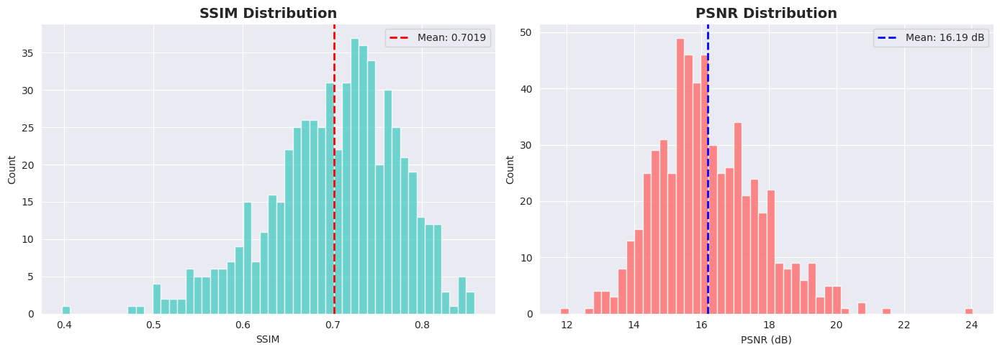

In [29]:
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

axes[0].hist(all_ssim, bins=50, color='#4ECDC4', edgecolor='white', alpha=0.8)
axes[0].axvline(np.mean(all_ssim), color='red', linestyle='--', linewidth=2,
                label=f'Mean: {np.mean(all_ssim):.4f}')
axes[0].set_title('SSIM Distribution', fontsize=14, fontweight='bold')
axes[0].set_xlabel('SSIM')
axes[0].set_ylabel('Count')
axes[0].legend()

axes[1].hist(all_psnr, bins=50, color='#FF6B6B', edgecolor='white', alpha=0.8)
axes[1].axvline(np.mean(all_psnr), color='blue', linestyle='--', linewidth=2,
                label=f'Mean: {np.mean(all_psnr):.2f} dB')
axes[1].set_title('PSNR Distribution', fontsize=14, fontweight='bold')
axes[1].set_xlabel('PSNR (dB)')
axes[1].set_ylabel('Count')
axes[1].legend()

plt.tight_layout()
save_figure_with_description(fig,
    os.path.join(config.RESULTS_DIR, 'metric_distributions.png'),
    f"""METRIC DISTRIBUTIONS — SSIM & PSNR

This figure shows the distribution of two key reconstruction quality metrics
computed over the validation set of the SOCOFing fingerprint dataset.

Left panel — SSIM (Structural Similarity Index):
  Measures structural similarity between original and reconstructed fingerprints.
  Range: [0, 1] where 1 = perfect reconstruction.
  Mean SSIM: {np.mean(all_ssim):.4f} ± {np.std(all_ssim):.4f}

Right panel — PSNR (Peak Signal-to-Noise Ratio):
  Measures reconstruction fidelity in decibels.
  Higher is better. Typical good range: 20-40 dB.
  Mean PSNR: {np.mean(all_psnr):.2f} ± {np.std(all_psnr):.2f} dB

These metrics demonstrate the VAE's ability to faithfully reconstruct
fingerprint images from their compressed latent representations.
""")
plt.show()


In [30]:
def compute_activation_statistics(images_list):
    """Compute mean and covariance of flattened image features"""
    # Use flattened pixel values as features (simple but effective for fingerprints)
    features = []
    for imgs in images_list:
        flat = imgs.view(imgs.size(0), -1).cpu().numpy()
        features.append(flat)
    features = np.concatenate(features, axis=0)
    mu = np.mean(features, axis=0)
    sigma = np.cov(features, rowvar=False)
    return mu, sigma


In [31]:
def calculate_fid(mu1, sigma1, mu2, sigma2):
    """
    Fréchet Inception Distance (FID) — implemented from scratch.
    FID = ||μ1 - μ2||² + Tr(Σ1 + Σ2 - 2√(Σ1·Σ2))
    Lower is better. FID = 0 means identical distributions.
    """
    diff = mu1 - mu2
    # Product might be singular, use SVD
    covmean, _ = linalg.sqrtm(sigma1.dot(sigma2), disp=False)

    if np.iscomplexobj(covmean):
        covmean = covmean.real

    fid = np.sum(diff ** 2) + np.trace(sigma1 + sigma2 - 2.0 * covmean)
    return float(fid)



In [32]:
@torch.no_grad()
def compute_fid_score(model, data_loader, device, max_samples=1000):
    """Compute FID between real and reconstructed images"""
    model.eval()
    real_images = []
    recon_images = []

    count = 0
    for images, _ in tqdm(data_loader, desc="Computing FID"):
        images = images.to(device)
        recon, _, _ = model(images)

        # Downsample for computational efficiency
        real_down = F.adaptive_avg_pool2d(images, 32)
        recon_down = F.adaptive_avg_pool2d(recon, 32)

        real_images.append(real_down)
        recon_images.append(recon_down)
        count += images.size(0)
        if count >= max_samples:
            break

    mu_real, sigma_real = compute_activation_statistics(real_images)
    mu_recon, sigma_recon = compute_activation_statistics(recon_images)

    fid = calculate_fid(mu_real, sigma_real, mu_recon, sigma_recon)
    print(f"\nFID Score (Real vs Reconstructed): {fid:.2f}")
    print("   (Lower is better — 0 means identical distributions)")
    return fid


In [33]:
fid_score = compute_fid_score(model, val_loader, DEVICE)

Computing FID:   0%|          | 0/10 [00:00<?, ?it/s]


FID Score (Real vs Reconstructed): 3.36
   (Lower is better — 0 means identical distributions)


In [34]:
@torch.no_grad()
def detailed_reconstruction_grid(model, data_loader, device, num=12, save_path=None):
    """Show detailed reconstruction comparison with per-image SSIM/PSNR"""
    model.eval()
    images, metas = next(iter(data_loader))
    images = images[:num].to(device)
    recon, _, _ = model(images)

    fig, axes = plt.subplots(3, num, figsize=(2.5 * num, 7.5))
    fig.suptitle('Reconstruction Quality: Original → Reconstructed → Difference',
                 fontsize=14, fontweight='bold')

    for i in range(num):
        orig = images[i:i+1]
        rec = recon[i:i+1]

        ssim_val = compute_ssim(orig, rec)
        psnr_val = compute_psnr(orig, rec)
        diff = torch.abs(orig - rec)

        axes[0, i].imshow(orig[0, 0].cpu(), cmap='gray')
        axes[0, i].axis('off')

        axes[1, i].imshow(rec[0, 0].cpu(), cmap='gray')
        axes[1, i].set_title(f'SSIM:{ssim_val:.3f}\nPSNR:{psnr_val:.1f}', fontsize=7)
        axes[1, i].axis('off')

        axes[2, i].imshow(diff[0, 0].cpu(), cmap='hot')
        axes[2, i].axis('off')

    axes[0, 0].set_ylabel('Original', fontsize=11, fontweight='bold')
    axes[1, 0].set_ylabel('Reconstructed', fontsize=11, fontweight='bold')
    axes[2, 0].set_ylabel('Error Map', fontsize=11, fontweight='bold')

    plt.tight_layout()
    if save_path:
        save_figure_with_description(fig, save_path,
            """DETAILED RECONSTRUCTION COMPARISON

This figure shows a side-by-side comparison of original fingerprints (top row),
their VAE reconstructions (middle row), and pixel-wise absolute error maps (bottom row).

Each column represents one fingerprint from the validation set.
The error map uses a 'hot' colormap where brighter regions indicate higher reconstruction error.

Per-image SSIM and PSNR scores are shown above each reconstructed image.
This visualization helps assess which fingerprint features are well-captured
by the latent representation and where information loss occurs.
""")
    plt.show()


Saved: detailed_reconstructions.png
Description: detailed_reconstructions_description.txt


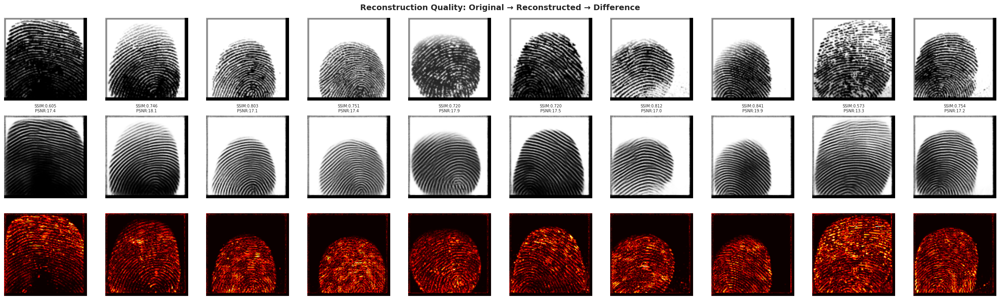

In [35]:
detailed_reconstruction_grid(model, val_loader, DEVICE, num=10,
    save_path=os.path.join(config.RESULTS_DIR, 'detailed_reconstructions.png'))

In [38]:

@torch.no_grad()
def encode_dataset(model, data_loader, device):
    """Encode the entire dataset into latent vectors with metadata"""
    model.eval()
    all_mu = []
    all_metadata = []

    for images, metas in tqdm(data_loader, desc="Encoding dataset"):
        images = images.to(device)
        mu, _ = model.encoder(images)
        all_mu.append(mu.cpu().numpy())

        # metas is a dict of lists (collated by DataLoader), convert to list of dicts
        batch_size = images.size(0)
        for i in range(batch_size):
            meta_dict = {}
            for k, v in metas.items():
                if isinstance(v, torch.Tensor):
                    meta_dict[k] = v[i].item()
                elif isinstance(v, (list, tuple)):
                    meta_dict[k] = v[i]
                else:
                    meta_dict[k] = v
            all_metadata.append(meta_dict)

    latent_vectors = np.concatenate(all_mu, axis=0)
    print(f"Encoded {latent_vectors.shape[0]} images → latent vectors of dim {latent_vectors.shape[1]}")
    return latent_vectors, all_metadata

In [39]:
latent_vectors, all_metadata = encode_dataset(model, full_loader, DEVICE)

Encoding dataset:   0%|          | 0/94 [00:00<?, ?it/s]

Encoded 6000 images → latent vectors of dim 256


In [40]:
# Extract labels for coloring
genders = [m['gender'] for m in all_metadata]
fingers = [m['finger'] for m in all_metadata]
hands = [m['hand'] for m in all_metadata]
subject_ids = [m['subject_id'] for m in all_metadata]

In [41]:
def plot_tsne(latent_vectors, labels, label_name, perplexity=30, save_path=None):
    """t-SNE visualization of latent space colored by labels"""
    print(f"   Running t-SNE (perplexity={perplexity})...")
    tsne = TSNE(n_components=2, perplexity=perplexity, random_state=config.SEED,
                n_iter=1000, learning_rate='auto', init='pca')
    z_2d = tsne.fit_transform(latent_vectors)

    unique_labels = sorted(set(labels))
    colors = plt.cm.tab10(np.linspace(0, 1, len(unique_labels)))

    fig, ax = plt.subplots(figsize=(12, 10))
    for i, label in enumerate(unique_labels):
        mask = np.array(labels) == label
        ax.scatter(z_2d[mask, 0], z_2d[mask, 1], c=[colors[i]], label=label,
                  alpha=0.5, s=15, edgecolors='none')

    ax.set_title(f't-SNE Visualization of Latent Space\n(colored by {label_name})',
                fontsize=14, fontweight='bold')
    ax.set_xlabel('t-SNE Dimension 1')
    ax.set_ylabel('t-SNE Dimension 2')
    ax.legend(markerscale=3, fontsize=10, loc='best')
    plt.tight_layout()
    if save_path:
        save_figure_with_description(fig, save_path,
            f"""t-SNE VISUALIZATION OF LATENT SPACE (colored by {label_name})

t-SNE (t-distributed Stochastic Neighbor Embedding) projects the {latent_vectors.shape[1]}-dimensional
latent vectors into 2D for visualization while preserving local structure.

Perplexity: {perplexity} | Iterations: 1000 | Init: PCA
Total samples: {latent_vectors.shape[0]}

Each point represents one fingerprint encoded into the latent space.
Points are colored by {label_name} to reveal whether the VAE has learned
to organize fingerprints by this attribute in its latent representation.

Clusters of same-colored points indicate the model has captured
{label_name}-related features in its learned representation.
""")
    plt.show()
    return z_2d

   Running t-SNE (perplexity=30)...
Saved: tsne_finger.png
Description: tsne_finger_description.txt


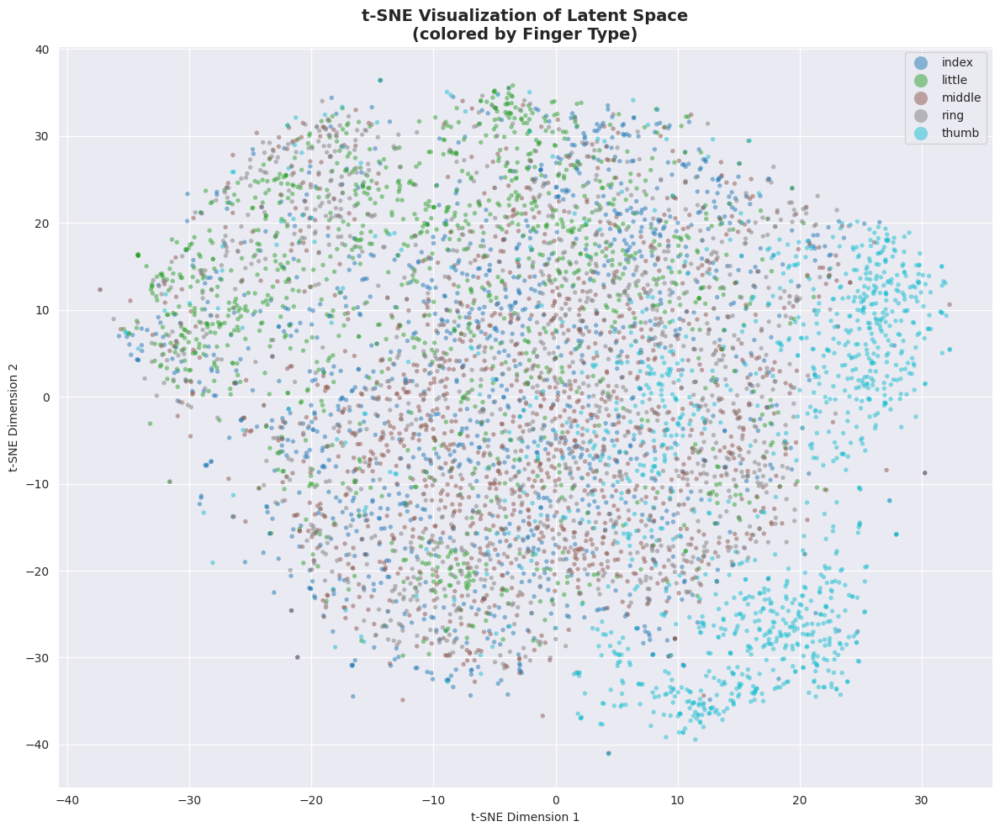

   Running t-SNE (perplexity=30)...
Saved: tsne_gender.png
Description: tsne_gender_description.txt


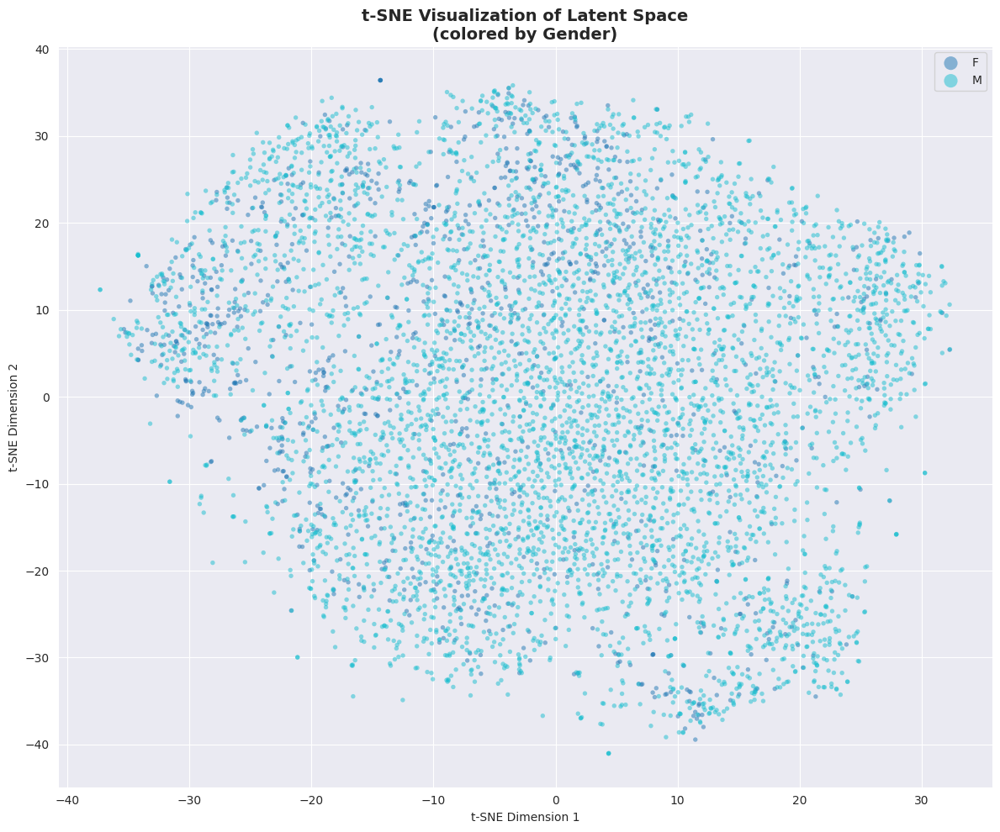

   Running t-SNE (perplexity=30)...
Saved: tsne_hand.png
Description: tsne_hand_description.txt


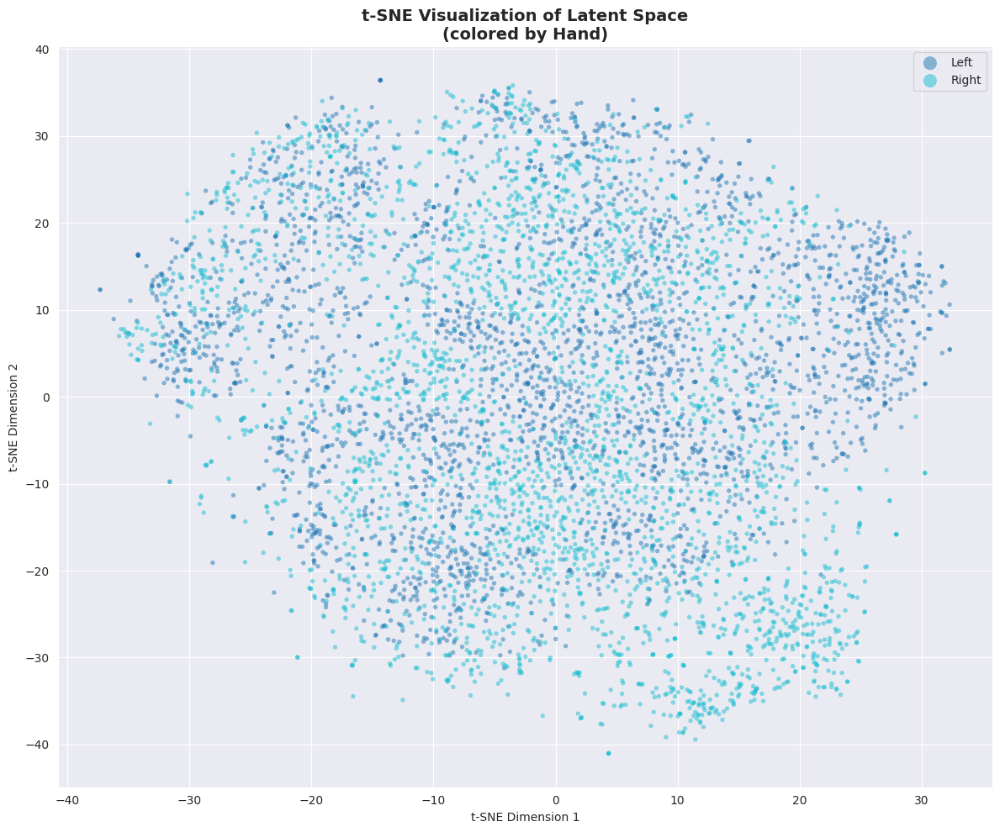

array([[ -9.848543 ,  -2.0206647],
       [  7.9261036,  27.43174  ],
       [-11.638977 ,  -4.2895174],
       ...,
       [ -5.12617  ,  27.018694 ],
       [ 17.417225 ,  10.484419 ],
       [ 12.96608  , -26.315718 ]], dtype=float32)

In [42]:
# t-SNE by finger type
z_tsne = plot_tsne(latent_vectors, fingers, 'Finger Type',
    save_path=os.path.join(config.RESULTS_DIR, 'tsne_finger.png'))

# t-SNE by gender
plot_tsne(latent_vectors, genders, 'Gender',
    save_path=os.path.join(config.RESULTS_DIR, 'tsne_gender.png'))

# t-SNE by hand
plot_tsne(latent_vectors, hands, 'Hand',
    save_path=os.path.join(config.RESULTS_DIR, 'tsne_hand.png'))


In [43]:
def plot_pca(latent_vectors, labels, label_name, save_path=None):
    """PCA visualization of latent space"""
    pca = PCA(n_components=2)
    z_pca = pca.fit_transform(latent_vectors)

    unique_labels = sorted(set(labels))
    colors = plt.cm.tab10(np.linspace(0, 1, len(unique_labels)))

    fig, axes = plt.subplots(1, 2, figsize=(18, 7))

    # Scatter plot
    for i, label in enumerate(unique_labels):
        mask = np.array(labels) == label
        axes[0].scatter(z_pca[mask, 0], z_pca[mask, 1], c=[colors[i]], label=label,
                       alpha=0.5, s=15, edgecolors='none')
    axes[0].set_title(f'PCA — Latent Space (colored by {label_name})', fontweight='bold')
    axes[0].set_xlabel(f'PC1 ({pca.explained_variance_ratio_[0]*100:.1f}% var)')
    axes[0].set_ylabel(f'PC2 ({pca.explained_variance_ratio_[1]*100:.1f}% var)')
    axes[0].legend(markerscale=3)

    # Explained variance
    pca_full = PCA(n_components=min(50, latent_vectors.shape[1]))
    pca_full.fit(latent_vectors)
    cumvar = np.cumsum(pca_full.explained_variance_ratio_) * 100

    axes[1].bar(range(1, len(cumvar)+1), pca_full.explained_variance_ratio_*100,
               alpha=0.6, color='steelblue', label='Individual')
    axes[1].plot(range(1, len(cumvar)+1), cumvar, 'r-o', markersize=3, label='Cumulative')
    axes[1].set_title('PCA Explained Variance', fontweight='bold')
    axes[1].set_xlabel('Principal Component')
    axes[1].set_ylabel('Explained Variance (%)')
    axes[1].legend()
    axes[1].axhline(y=95, color='green', linestyle='--', alpha=0.5, label='95% threshold')

    plt.tight_layout()
    if save_path:
        save_figure_with_description(fig, save_path,
            f"""PCA VISUALIZATION OF LATENT SPACE (colored by {label_name})

Left panel — PCA scatter plot:
  Principal Component Analysis projects the {latent_vectors.shape[1]}-dimensional latent space
  onto its two directions of maximum variance.
  Points are colored by {label_name}.
  Explained variance: PC1={pca.explained_variance_ratio_[0]*100:.1f}%, PC2={pca.explained_variance_ratio_[1]*100:.1f}%

Right panel — Explained variance:
  Bar chart shows individual variance per component.
  Red line shows cumulative explained variance.
  This reveals how many latent dimensions carry meaningful information.
""")
    plt.show()


Saved: pca_finger.png
Description: pca_finger_description.txt


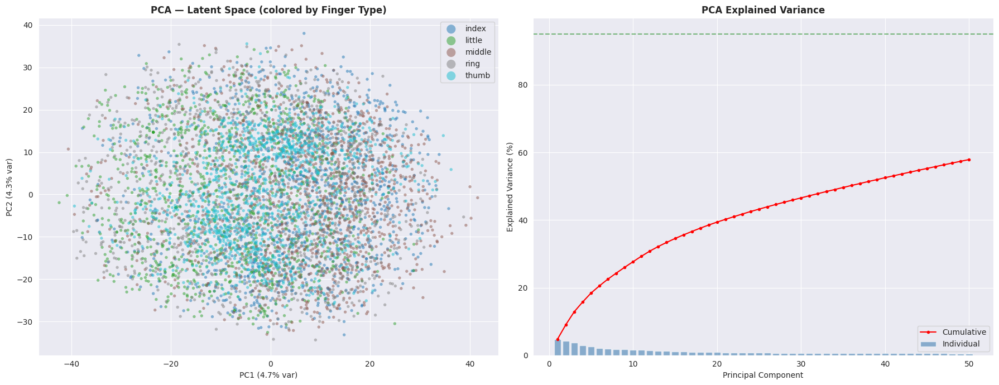

In [44]:
plot_pca(latent_vectors, fingers, 'Finger Type',
    save_path=os.path.join(config.RESULTS_DIR, 'pca_finger.png'))

In [45]:
def clustering_analysis(latent_vectors, true_labels, label_name, n_clusters_range=range(2, 15)):
    """Perform K-Means clustering and evaluate quality"""

    le = LabelEncoder()
    true_encoded = le.fit_transform(true_labels)
    n_true = len(set(true_labels))

    # Find optimal K using silhouette score
    silhouette_scores = []
    for k in tqdm(n_clusters_range, desc="Finding optimal K"):
        km = KMeans(n_clusters=k, random_state=config.SEED, n_init=10)
        pred = km.fit_predict(latent_vectors)
        sil = silhouette_score(latent_vectors, pred, sample_size=min(5000, len(latent_vectors)))
        silhouette_scores.append(sil)

    optimal_k = list(n_clusters_range)[np.argmax(silhouette_scores)]

    # Final clustering with optimal K and with true K
    km_opt = KMeans(n_clusters=optimal_k, random_state=config.SEED, n_init=10)
    pred_opt = km_opt.fit_predict(latent_vectors)
    sil_opt = silhouette_score(latent_vectors, pred_opt, sample_size=min(5000, len(latent_vectors)))

    km_true = KMeans(n_clusters=n_true, random_state=config.SEED, n_init=10)
    pred_true = km_true.fit_predict(latent_vectors)
    ari = adjusted_rand_score(true_encoded, pred_true)
    sil_true = silhouette_score(latent_vectors, pred_true, sample_size=min(5000, len(latent_vectors)))

    print(f"\n📊 Clustering Analysis (by {label_name}):")
    print(f"   True clusters:     {n_true}")
    print(f"   Optimal K:         {optimal_k}")
    print(f"   Silhouette (K={optimal_k}): {sil_opt:.4f}")
    print(f"   Silhouette (K={n_true}):  {sil_true:.4f}")
    print(f"   Adjusted Rand Index: {ari:.4f}")

    # Plot
    fig, axes = plt.subplots(1, 2, figsize=(14, 5))

    axes[0].plot(list(n_clusters_range), silhouette_scores, 'bo-')
    axes[0].axvline(x=optimal_k, color='r', linestyle='--', label=f'Optimal K={optimal_k}')
    axes[0].axvline(x=n_true, color='g', linestyle='--', label=f'True K={n_true}')
    axes[0].set_title('Silhouette Score vs K', fontweight='bold')
    axes[0].set_xlabel('Number of Clusters (K)')
    axes[0].set_ylabel('Silhouette Score')
    axes[0].legend()

    # Confusion-style heatmap
    ct = pd.crosstab(pd.Series(true_labels, name='True'),
                     pd.Series(pred_true, name='Predicted'))
    sns.heatmap(ct, annot=True, fmt='d', cmap='YlOrRd', ax=axes[1])
    axes[1].set_title(f'Cluster Assignment vs True {label_name}', fontweight='bold')

    plt.tight_layout()
    clust_path = os.path.join(config.RESULTS_DIR, f'clustering_{label_name.lower()}.png')
    save_figure_with_description(fig, clust_path,
        f"""CLUSTERING ANALYSIS (by {label_name})

Left panel — Silhouette Score vs Number of Clusters (K):
  Silhouette score measures how well-separated clusters are. Range: [-1, 1], higher is better.
  Optimal K (red dashed): {optimal_k}
  True number of categories (green dashed): {n_true}
  Silhouette at optimal K: {sil_opt:.4f}
  Silhouette at true K={n_true}: {sil_true:.4f}

Right panel — Confusion Matrix (K-Means clusters vs true {label_name}):
  Heatmap showing how predicted clusters align with true labels.
  Adjusted Rand Index (ARI): {ari:.4f}
  ARI=1 means perfect alignment, ARI=0 means random.

This analysis reveals whether the VAE's latent space naturally groups
fingerprints by {label_name} without any supervised signal.
""")
    plt.show()

    return {'optimal_k': optimal_k, 'silhouette': sil_opt, 'ARI': ari}

Finding optimal K:   0%|          | 0/13 [00:00<?, ?it/s]


📊 Clustering Analysis (by Finger Type):
   True clusters:     5
   Optimal K:         2
   Silhouette (K=2): 0.0323
   Silhouette (K=5):  0.0281
   Adjusted Rand Index: 0.0856
Saved: clustering_finger type.png
Description: clustering_finger type_description.txt


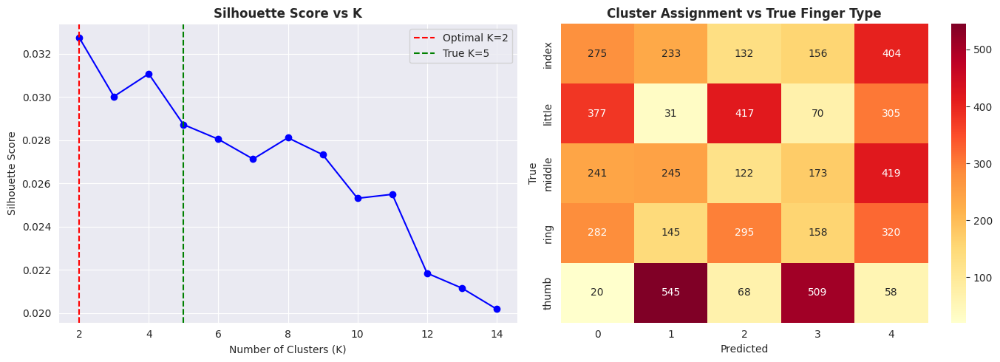

In [46]:
cluster_results = clustering_analysis(latent_vectors, fingers, 'Finger Type')

In [47]:
@torch.no_grad()
def latent_interpolation(model, dataset, device, idx1, idx2, n_steps=10, save_path=None):
    """
    Linear interpolation in latent space between two fingerprints.
    z_interp = (1 - α)·z1 + α·z2, where α ∈ [0, 1]
    """
    model.eval()
    img1, meta1 = dataset[idx1]
    img2, meta2 = dataset[idx2]

    img1 = img1.unsqueeze(0).to(device)
    img2 = img2.unsqueeze(0).to(device)

    mu1, _ = model.encoder(img1)
    mu2, _ = model.encoder(img2)

    # Generate interpolations
    alphas = np.linspace(0, 1, n_steps)
    interpolated = []
    for alpha in alphas:
        z_interp = (1 - alpha) * mu1 + alpha * mu2
        img_interp = model.decode(z_interp)
        interpolated.append(img_interp.cpu().squeeze().numpy())

    # Plot
    fig, axes = plt.subplots(1, n_steps, figsize=(2 * n_steps, 2.5))
    label1 = f"ID:{meta1['subject_id']} {meta1['finger']}"
    label2 = f"ID:{meta2['subject_id']} {meta2['finger']}"
    fig.suptitle(f'Latent Space Interpolation: [{label1}] → [{label2}]',
                fontsize=13, fontweight='bold')

    for i, (alpha, img) in enumerate(zip(alphas, interpolated)):
        axes[i].imshow(img, cmap='gray')
        axes[i].set_title(f'α={alpha:.2f}', fontsize=8)
        axes[i].axis('off')

    plt.tight_layout()
    if save_path:
        save_figure_with_description(fig, save_path,
            f"""LATENT SPACE INTERPOLATION

Linear interpolation between two fingerprints in the VAE latent space.
Formula: z_interp = (1 - α) · z₁ + α · z₂, where α ∈ [0, 1]

Source (α=0): {label1}
Target (α=1): {label2}
Steps: {n_steps}

Smooth transitions between fingerprints demonstrate that the VAE has learned
a continuous and well-structured latent space. Each intermediate image reveals
how fingerprint features gradually transform from one identity to another.

This is only possible because the VAE's KL divergence term encourages
a smooth, well-regularized latent manifold.
""")
    plt.show()

Interpolation: Same person, different fingers
Saved: interpolation_same_person.png
Description: interpolation_same_person_description.txt


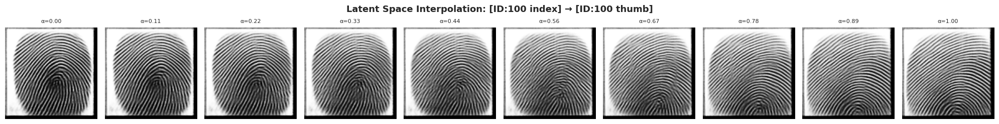

Interpolation: Different persons
Saved: interpolation_diff_person.png
Description: interpolation_diff_person_description.txt


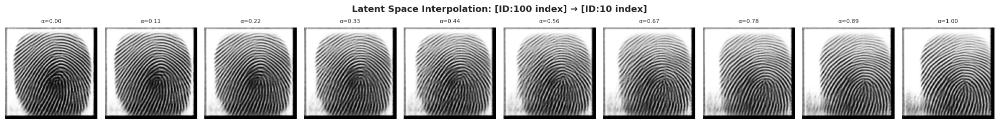

Interpolation: Male vs Female
Saved: interpolation_gender.png
Description: interpolation_gender_description.txt


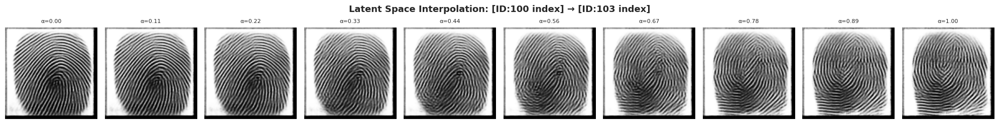

In [48]:
print("Interpolation: Same person, different fingers")
latent_interpolation(model, dataset, DEVICE, 0, 4, n_steps=10,
    save_path=os.path.join(config.RESULTS_DIR, 'interpolation_same_person.png'))

print("Interpolation: Different persons")
latent_interpolation(model, dataset, DEVICE, 0, 100, n_steps=10,
    save_path=os.path.join(config.RESULTS_DIR, 'interpolation_diff_person.png'))

print("Interpolation: Male vs Female")
# Find first M and first F
m_idx = next(i for i, m in enumerate(dataset.metadata) if m['gender'] == 'M')
f_idx = next(i for i, m in enumerate(dataset.metadata) if m['gender'] == 'F')
latent_interpolation(model, dataset, DEVICE, m_idx, f_idx, n_steps=10,
    save_path=os.path.join(config.RESULTS_DIR, 'interpolation_gender.png'))


In [49]:
@torch.no_grad()
def latent_traversal(model, dataset, device, sample_idx=0, n_dims=10,
                     n_steps=9, range_val=3.0, save_path=None):
    """
    Modify individual latent variables to observe their effect.
    For each dimension, vary it from -range to +range while keeping others fixed.
    """
    model.eval()
    img, meta = dataset[sample_idx]
    img = img.unsqueeze(0).to(device)
    mu, _ = model.encoder(img)

    # Find the dimensions with highest variance
    all_mu = []
    for i in range(min(500, len(dataset))):
        im, _ = dataset[i]
        m, _ = model.encoder(im.unsqueeze(0).to(device))
        all_mu.append(m.cpu().numpy())
    all_mu = np.concatenate(all_mu, axis=0)
    dim_variance = np.var(all_mu, axis=0)
    top_dims = np.argsort(dim_variance)[-n_dims:][::-1]

    fig, axes = plt.subplots(n_dims, n_steps, figsize=(2 * n_steps, 2 * n_dims))
    fig.suptitle('Feature Sensitivity: Latent Dimension Traversal\n'
                 '(Each row = one dimension varied from -3σ to +3σ)',
                fontsize=14, fontweight='bold')

    values = np.linspace(-range_val, range_val, n_steps)

    for row, dim in enumerate(top_dims):
        for col, val in enumerate(values):
            z_mod = mu.clone()
            z_mod[0, dim] = val
            decoded = model.decode(z_mod)
            axes[row, col].imshow(decoded[0, 0].cpu().numpy(), cmap='gray')
            axes[row, col].axis('off')
            if col == 0:
                axes[row, col].set_ylabel(f'Dim {dim}\n(var:{dim_variance[dim]:.2f})',
                                          fontsize=8, fontweight='bold')
            if row == 0:
                axes[row, col].set_title(f'{val:.1f}', fontsize=8)

    plt.tight_layout()
    if save_path:
        dim_list = ', '.join([str(d) for d in top_dims])
        save_figure_with_description(fig, save_path,
            f"""FEATURE SENSITIVITY ANALYSIS — LATENT DIMENSION TRAVERSAL

Each row shows the effect of varying a single latent dimension from
-{range_val}σ to +{range_val}σ while keeping all other dimensions fixed.

Dimensions shown (ordered by variance): {dim_list}
Number of steps: {n_steps}
Base fingerprint: sample index {sample_idx}

This analysis reveals what each latent dimension controls:
- Some dimensions may control ridge thickness or density.
- Others may affect overall curvature or pattern type (whorl, loop, arch).
- Some dimensions may encode rotation or translation.

Dimensions with high variance carry the most fingerprint-discriminative
information, while low-variance dimensions capture noise or subtle details.
""")
    plt.show()


Saved: latent_traversal.png
Description: latent_traversal_description.txt


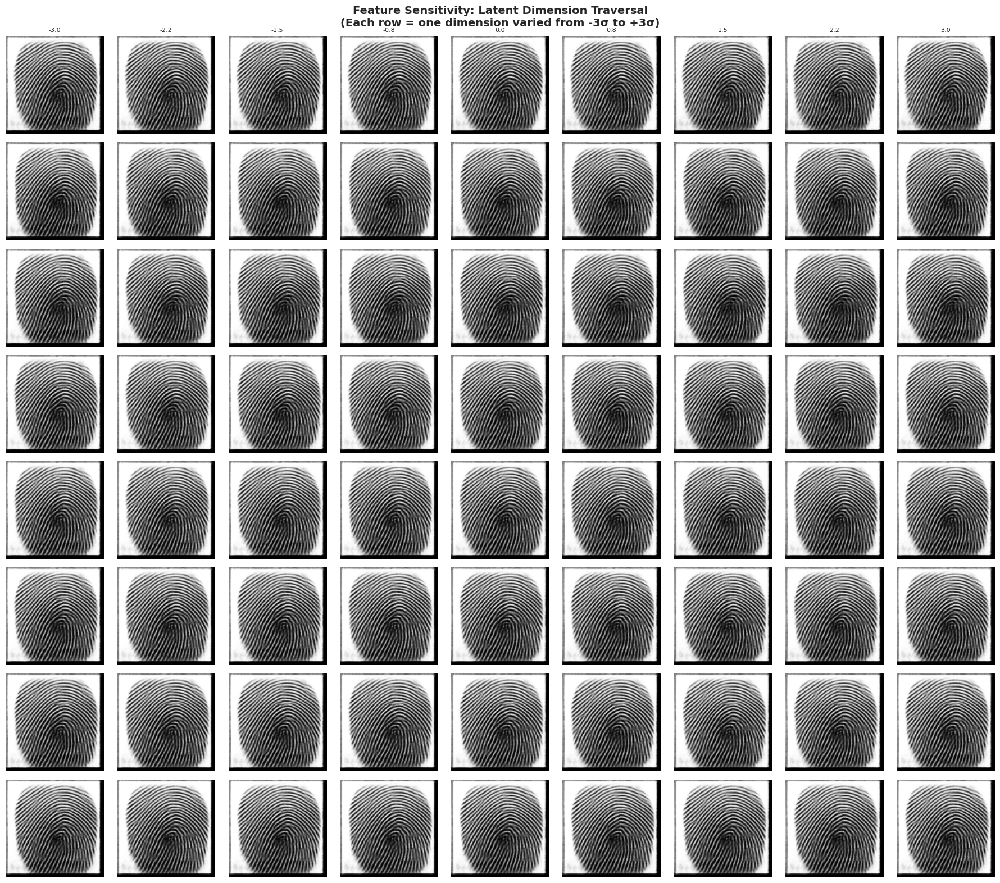

In [50]:
latent_traversal(model, dataset, DEVICE, sample_idx=0, n_dims=8, n_steps=9,
    save_path=os.path.join(config.RESULTS_DIR, 'latent_traversal.png'))

In [51]:
@torch.no_grad()
def generate_random_fingerprints(model, device, n_samples=20, save_path=None):
    """Generate novel fingerprints by sampling z ~ N(0, I)"""
    model.eval()
    z = torch.randn(n_samples, model.latent_dim).to(device)
    generated = model.decode(z).cpu()

    rows = n_samples // 5
    fig, axes = plt.subplots(rows, 5, figsize=(12, 2.5 * rows))
    fig.suptitle('Generated Fingerprints (sampled from N(0, I))',
                fontsize=14, fontweight='bold')

    for i in range(n_samples):
        r, c = i // 5, i % 5
        ax = axes[r, c] if rows > 1 else axes[c]
        ax.imshow(generated[i, 0], cmap='gray')
        ax.axis('off')

    plt.tight_layout()
    if save_path:
        save_figure_with_description(fig, save_path,
            f"""RANDOMLY GENERATED FINGERPRINTS

These fingerprints were generated by sampling random latent vectors from
the standard normal prior: z ~ N(0, I), and decoding them through the
trained VAE decoder.

Number of samples: {n_samples}
Latent dimension: {model.latent_dim}

These are entirely novel fingerprints that do not exist in the training data.
The quality and realism of these generated images demonstrates how well the
VAE has learned the underlying distribution of fingerprint patterns.

Realistic-looking generated fingerprints indicate that the model has captured
the essential structural features: ridge patterns, curvature, minutiae-like
details, and overall morphology.
""")
    plt.show()

Saved: generated_fingerprints.png
Description: generated_fingerprints_description.txt


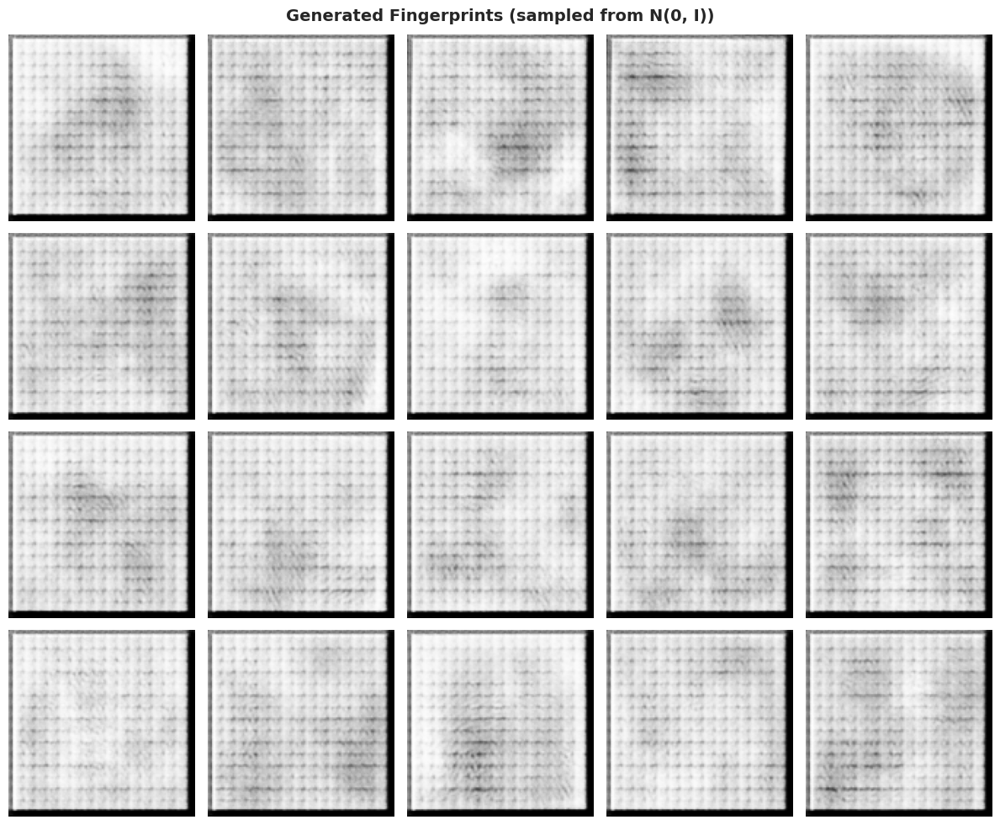

In [53]:
generate_random_fingerprints(model, DEVICE, n_samples=20,
    save_path=os.path.join(config.RESULTS_DIR, 'generated_fingerprints.png'))

In [54]:
def latent_distribution_analysis(latent_vectors, save_path=None):
    """Analyze whether the latent space follows N(0, I) as expected"""
    fig, axes = plt.subplots(2, 2, figsize=(14, 10))
    fig.suptitle('Latent Space Distribution Analysis', fontsize=14, fontweight='bold')

    # Mean of each dimension
    dim_means = np.mean(latent_vectors, axis=0)
    axes[0, 0].bar(range(len(dim_means)), dim_means, color='steelblue', alpha=0.7)
    axes[0, 0].axhline(y=0, color='red', linestyle='--')
    axes[0, 0].set_title('Mean per Latent Dimension', fontweight='bold')
    axes[0, 0].set_xlabel('Dimension')
    axes[0, 0].set_ylabel('Mean')

    # Std of each dimension
    dim_stds = np.std(latent_vectors, axis=0)
    axes[0, 1].bar(range(len(dim_stds)), dim_stds, color='coral', alpha=0.7)
    axes[0, 1].axhline(y=1, color='red', linestyle='--', label='Target (σ=1)')
    axes[0, 1].set_title('Std Dev per Latent Dimension', fontweight='bold')
    axes[0, 1].set_xlabel('Dimension')
    axes[0, 1].set_ylabel('Std')
    axes[0, 1].legend()

    # Distribution of a single dimension
    dim_idx = np.argmax(dim_stds)
    axes[1, 0].hist(latent_vectors[:, dim_idx], bins=50, density=True,
                    color='#4ECDC4', edgecolor='white', alpha=0.8, label=f'Dim {dim_idx}')
    x = np.linspace(-4, 4, 100)
    axes[1, 0].plot(x, 1/np.sqrt(2*np.pi) * np.exp(-x**2/2), 'r-',
                    linewidth=2, label='N(0,1)')
    axes[1, 0].set_title(f'Distribution of Dim {dim_idx} (highest variance)', fontweight='bold')
    axes[1, 0].legend()

    # Norm of latent vectors
    norms = np.linalg.norm(latent_vectors, axis=1)
    axes[1, 1].hist(norms, bins=50, color='#FF6B6B', edgecolor='white', alpha=0.8)
    expected_norm = np.sqrt(latent_vectors.shape[1])
    axes[1, 1].axvline(expected_norm, color='blue', linestyle='--',
                       label=f'Expected: √{latent_vectors.shape[1]}≈{expected_norm:.1f}')
    axes[1, 1].set_title('Latent Vector Norms', fontweight='bold')
    axes[1, 1].set_xlabel('L2 Norm')
    axes[1, 1].legend()

    plt.tight_layout()
    if save_path:
        save_figure_with_description(fig, save_path,
            f"""LATENT SPACE DISTRIBUTION ANALYSIS

This figure analyzes whether the learned latent space matches the expected
prior distribution N(0, I) imposed by the KL divergence term.

Top-left — Mean per dimension:
  Ideally all means should be close to 0 (red dashed line).
  Deviations indicate the encoder has shifted the latent center.

Top-right — Std dev per dimension:
  Ideally all std devs should be close to 1 (red dashed line).
  Values < 1 indicate dimensions that are "collapsed" (unused).
  Values > 1 indicate dimensions carrying extra information.

Bottom-left — Distribution of highest-variance dimension:
  Compared against N(0,1) Gaussian (red curve).
  Close match indicates good regularization.

Bottom-right — L2 norms of latent vectors:
  For {latent_vectors.shape[1]}-dim N(0,I), expected norm ≈ √{latent_vectors.shape[1]} ≈ {np.sqrt(latent_vectors.shape[1]):.1f}
""")
    plt.show()

Saved: latent_distribution.png
Description: latent_distribution_description.txt


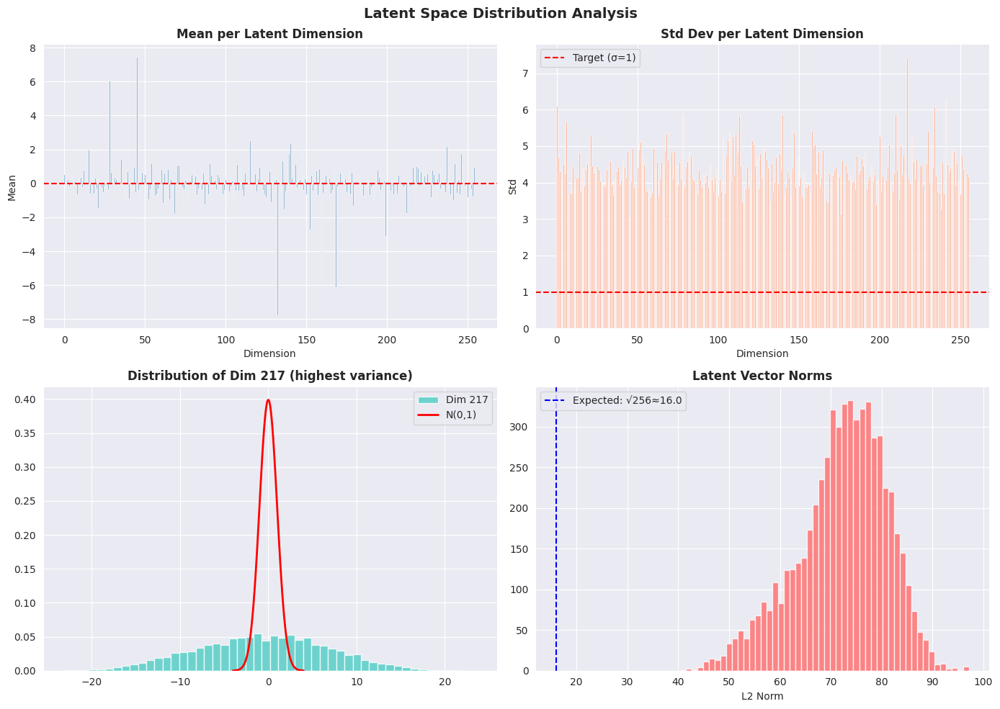

In [55]:
latent_distribution_analysis(latent_vectors,
    save_path=os.path.join(config.RESULTS_DIR, 'latent_distribution.png'))

In [56]:
def generate_results_summary(metrics, fid_score, cluster_results, config, ckpt):
    """Generate a comprehensive summary table for presentation"""

    print("\n" + "=" * 70)
    print("COMPREHENSIVE RESULTS SUMMARY")
    print("=" * 70)

    print(f"\n🏗️  Model Configuration:")
    print(f"Architecture: Convolutional VAE")
    print(f"Latent dim: {config.LATENT_DIM}")
    print(f"Image size: {config.IMG_SIZE}×{config.IMG_SIZE}")
    print(f"Encoder: {config.ENCODER_CHANNELS}")
    print(f"Decoder: {config.DECODER_CHANNELS}")

    print(f"\nTraining Details:")
    print(f"Dataset: SOCOFing (Real fingerprints)")
    print(f"Best epoch: {ckpt['epoch']}")
    print(f"Final val loss: {ckpt['best_val_loss']:.4f}")
    print(f"Batch size: {config.BATCH_SIZE}")
    print(f"Optimizer: Adam (lr={config.LEARNING_RATE})")

    print(f"\nReconstruction Quality:")
    for name, vals in metrics.items():
        print(f"{name:<20} {vals['mean']:.4f} ± {vals['std']:.4f}")

    print(f"\nGenerative Quality:")
    print(f"FID Score: {fid_score:.2f}")

    print(f"\nClustering Quality (Finger Type):")
    print(f"Optimal K:{cluster_results['optimal_k']}")
    print(f"Silhouette:{cluster_results['silhouette']:.4f}")
    print(f"Adjusted Rand:{cluster_results['ARI']:.4f}")

    print("\n" + "=" * 70)
    print("All results saved to:", config.RESULTS_DIR)
    print("=" * 70)

    # Save as text file too
    summary_path = os.path.join(config.RESULTS_DIR, 'results_summary.txt')
    with open(summary_path, 'w') as f:
        f.write("VAE Fingerprint Analysis — Results Summary\n")
        f.write("=" * 50 + "\n\n")
        f.write(f"Latent Dim: {config.LATENT_DIM}\n")
        f.write(f"Image Size: {config.IMG_SIZE}x{config.IMG_SIZE}\n")
        f.write(f"Best Epoch: {ckpt['epoch']}\n\n")
        f.write("Reconstruction Metrics:\n")
        for name, vals in metrics.items():
            f.write(f"  {name}: {vals['mean']:.4f} ± {vals['std']:.4f}\n")
        f.write(f"\nFID Score: {fid_score:.2f}\n")
        f.write(f"Silhouette: {cluster_results['silhouette']:.4f}\n")
        f.write(f"ARI: {cluster_results['ARI']:.4f}\n")
    print(f"Summary saved to: {summary_path}")

In [57]:
generate_results_summary(metrics, fid_score, cluster_results, config, ckpt)


COMPREHENSIVE RESULTS SUMMARY

🏗️  Model Configuration:
Architecture: Convolutional VAE
Latent dim: 256
Image size: 128×128
Encoder: [32, 64, 128, 256, 512]
Decoder: [512, 256, 128, 64, 32]

Training Details:
Dataset: SOCOFing (Real fingerprints)
Best epoch: 200
Final val loss: 2928.5510
Batch size: 64
Optimizer: Adam (lr=0.0005)

Reconstruction Quality:
SSIM                 0.7019 ± 0.0727
PSNR (dB)            16.1869 ± 1.5538
MSE                  0.0255 ± 0.0086
BCE                  0.3959 ± 0.0654
KL Divergence        3602.8102 ± 0.0000

Generative Quality:
FID Score: 3.36

Clustering Quality (Finger Type):
Optimal K:2
Silhouette:0.0323
Adjusted Rand:0.0856

All results saved to: /content/drive/MyDrive/Colab_Notebooks/VAE/vae_fingerprints/results
Summary saved to: /content/drive/MyDrive/Colab_Notebooks/VAE/vae_fingerprints/results/results_summary.txt


In [58]:
@torch.no_grad()
def analyze_altered_robustness(model, config, device, save_path=None):
    """Test reconstruction quality on altered fingerprints (Easy/Medium/Hard)"""
    model.eval()
    results = {}

    for alt_type in ['Altered-Easy', 'Altered-Medium', 'Altered-Hard']:
        alt_dir = os.path.join(config.ALTERED_DIR, alt_type)
        if not os.path.isdir(alt_dir):
            print(f"   ⚠️  {alt_type} not found, skipping")
            continue

        alt_dataset = SOCOFingDataset(alt_dir, transform=val_transform, subset='Real')
        if len(alt_dataset) == 0:
            continue

        alt_loader = DataLoader(alt_dataset, batch_size=config.BATCH_SIZE, shuffle=False)

        ssim_vals = []
        psnr_vals = []
        count = 0

        for images, _ in alt_loader:
            images = images.to(device)
            recon, _, _ = model(images)
            for i in range(images.size(0)):
                ssim_vals.append(compute_ssim(images[i:i+1], recon[i:i+1]))
                psnr_vals.append(compute_psnr(images[i:i+1], recon[i:i+1]))
            count += images.size(0)
            if count >= 500:  # Limit for speed
                break

        results[alt_type] = {
            'SSIM': np.mean(ssim_vals),
            'PSNR': np.mean(psnr_vals),
            'n_samples': count
        }
        print(f"   {alt_type}: SSIM={np.mean(ssim_vals):.4f}, PSNR={np.mean(psnr_vals):.2f} dB ({count} samples)")

    if not results:
        print("   No altered datasets found")
        return results

    # Plot comparison
    categories = list(results.keys()) + ['Real']
    ssim_values = [results[k]['SSIM'] for k in results] + [metrics['SSIM']['mean']]
    psnr_values = [results[k]['PSNR'] for k in results] + [metrics['PSNR (dB)']['mean']]

    fig, axes = plt.subplots(1, 2, figsize=(14, 5))
    colors = ['#FF6B6B', '#FFA07A', '#FFD700', '#4ECDC4']

    axes[0].bar(categories, ssim_values, color=colors)
    axes[0].set_title('SSIM by Alteration Level', fontweight='bold')
    axes[0].set_ylabel('SSIM')
    for i, v in enumerate(ssim_values):
        axes[0].text(i, v + 0.005, f'{v:.4f}', ha='center', fontsize=9)

    axes[1].bar(categories, psnr_values, color=colors)
    axes[1].set_title('PSNR by Alteration Level', fontweight='bold')
    axes[1].set_ylabel('PSNR (dB)')
    for i, v in enumerate(psnr_values):
        axes[1].text(i, v + 0.2, f'{v:.2f}', ha='center', fontsize=9)

    plt.tight_layout()
    if save_path:
        desc_lines = "ROBUSTNESS ANALYSIS — ALTERED FINGERPRINTS\n\n"
        desc_lines += "This figure compares VAE reconstruction quality across different\n"
        desc_lines += "alteration levels from the SOCOFing dataset.\n\n"
        for cat in categories:
            if cat == 'Real':
                desc_lines += f"  Real: SSIM={metrics['SSIM']['mean']:.4f}, PSNR={metrics['PSNR (dB)']['mean']:.2f} dB\n"
            elif cat in results:
                desc_lines += f"  {cat}: SSIM={results[cat]['SSIM']:.4f}, PSNR={results[cat]['PSNR']:.2f} dB ({results[cat]['n_samples']} samples)\n"
        desc_lines += "\nExpected pattern: Real > Altered-Easy > Altered-Medium > Altered-Hard\n"
        desc_lines += "Declining metrics on harder alterations show the model learned\n"
        desc_lines += "clean fingerprint structure, not noise or distortion artifacts.\n"
        save_figure_with_description(fig, save_path, desc_lines)
    plt.show()
    return results

Robustness Analysis on Altered Fingerprints:
   Loaded 17931 images
   Altered-Easy: SSIM=0.6794, PSNR=15.75 dB (512 samples)
   Loaded 17067 images
   Altered-Medium: SSIM=0.6346, PSNR=15.36 dB (512 samples)
   Loaded 14272 images
   Altered-Hard: SSIM=0.6182, PSNR=15.36 dB (512 samples)
Saved: altered_robustness.png
Description: altered_robustness_description.txt


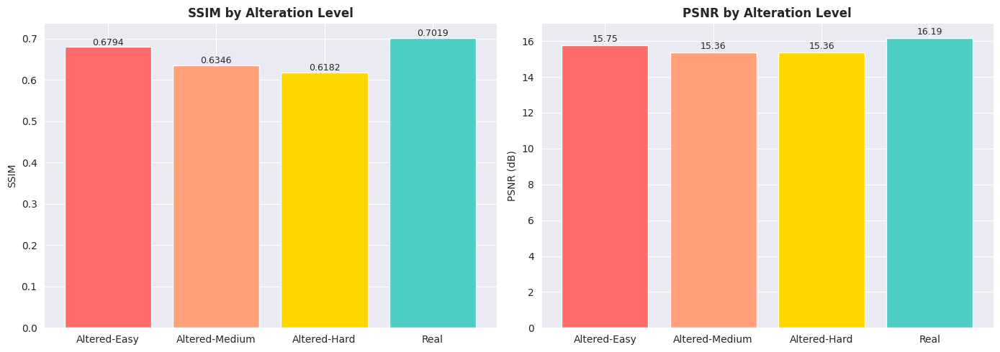

In [59]:
print("Robustness Analysis on Altered Fingerprints:")
alt_results = analyze_altered_robustness(model, config, DEVICE,
    save_path=os.path.join(config.RESULTS_DIR, 'altered_robustness.png'))

In [60]:
@torch.no_grad()
def latent_arithmetic(model, dataset, device, save_path=None):  # noqa
    """
    Demonstrate latent space arithmetic:
    z_result = z_A - z_B + z_C  (analogies in fingerprint space)
    Example: Left_index - Left_middle + Right_middle ≈ Right_index
    """
    model.eval()

    # Find specific images by metadata
    def find_idx(finger, hand, limit=5):
        for i, m in enumerate(dataset.metadata):
            if m['finger'] == finger and m['hand'] == hand:
                return i
        return 0

    pairs = [
        (find_idx('index', 'Left'), find_idx('middle', 'Left'), find_idx('middle', 'Right'),
         "Left_Index - Left_Middle + Right_Middle = ?"),
        (find_idx('thumb', 'Left'), find_idx('thumb', 'Right'), find_idx('index', 'Right'),
         "Left_Thumb - Right_Thumb + Right_Index = ?"),
    ]

    for idxA, idxB, idxC, title in pairs:
        imgA, _ = dataset[idxA]
        imgB, _ = dataset[idxB]
        imgC, _ = dataset[idxC]

        zA = model.encode(imgA.unsqueeze(0).to(device))
        zB = model.encode(imgB.unsqueeze(0).to(device))
        zC = model.encode(imgC.unsqueeze(0).to(device))

        z_result = zA - zB + zC
        result = model.decode(z_result)

        fig, axes = plt.subplots(1, 5, figsize=(12, 3))
        fig.suptitle(f'Latent Arithmetic: {title}', fontsize=12, fontweight='bold')

        axes[0].imshow(imgA.squeeze(), cmap='gray'); axes[0].set_title('A'); axes[0].axis('off')
        axes[1].imshow(imgB.squeeze(), cmap='gray'); axes[1].set_title('- B'); axes[1].axis('off')
        axes[2].imshow(imgC.squeeze(), cmap='gray'); axes[2].set_title('+ C'); axes[2].axis('off')
        axes[3].set_visible(False)
        axes[4].imshow(result[0, 0].cpu(), cmap='gray'); axes[4].set_title('= Result'); axes[4].axis('off')

        plt.tight_layout()
        if save_path:
            safe_title = title.replace(' ', '_').replace('?', '').replace('=', '')
            arith_path = save_path.rsplit('.', 1)[0] + f'_{safe_title[:30]}.png'
            save_figure_with_description(fig, arith_path,
                f"""LATENT SPACE ARITHMETIC — FINGERPRINT ANALOGIES

Demonstrates that the VAE's latent space supports meaningful vector arithmetic.

Operation: {title}
Formula: z_result = z_A - z_B + z_C

This works analogously to the famous word2vec example:
  "King - Man + Woman ≈ Queen"

For fingerprints, this means the latent space has decomposed fingerprint
attributes into additive components, showing the model has learned
disentangled or semi-disentangled representations of fingerprint features.
""")
        plt.show()


Saved: latent_arithmetic_Left_Index_-_Left_Middle_+_Rig.png
Description: latent_arithmetic_Left_Index_-_Left_Middle_+_Rig_description.txt


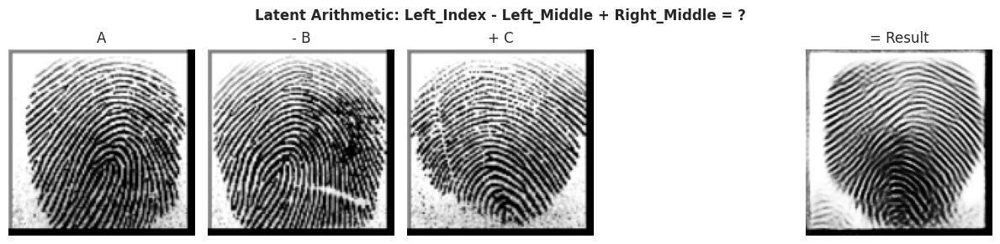

Saved: latent_arithmetic_Left_Thumb_-_Right_Thumb_+_Rig.png
Description: latent_arithmetic_Left_Thumb_-_Right_Thumb_+_Rig_description.txt


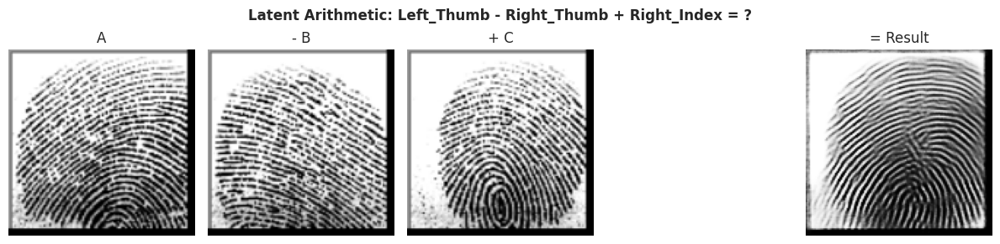

In [62]:
latent_arithmetic(model, dataset, DEVICE,
    save_path=os.path.join(config.RESULTS_DIR, 'latent_arithmetic.png'))

In [63]:

print("\nALL ANALYSIS COMPLETE!")
print(f"\nResults saved to: {config.RESULTS_DIR}")
print("\nGenerated files:")
for f in sorted(os.listdir(config.RESULTS_DIR)):
    size = os.path.getsize(os.path.join(config.RESULTS_DIR, f))
    print(f"{f} ({size/1024:.1f} KB)")

print("\nKey metrics to highlight in your presentation:")
print(f"• SSIM: {metrics['SSIM']['mean']:.4f}")
print(f"• PSNR: {metrics['PSNR (dB)']['mean']:.2f} dB")
print(f"• FID:  {fid_score:.2f}")
print(f"• Clustering Silhouette: {cluster_results['silhouette']:.4f}")




ALL ANALYSIS COMPLETE!

Results saved to: /content/drive/MyDrive/Colab_Notebooks/VAE/vae_fingerprints/results

Generated files:
altered_robustness.png (53.6 KB)
altered_robustness_description.txt (0.5 KB)
clustering_finger type.png (115.8 KB)
clustering_finger type_description.txt (0.7 KB)
dataset_statistics.png (55.9 KB)
detailed_reconstructions.png (2358.7 KB)
detailed_reconstructions_description.txt (0.6 KB)
generated_fingerprints.png (1290.0 KB)
generated_fingerprints_description.txt (0.6 KB)
interpolation_diff_person.png (758.9 KB)
interpolation_diff_person_description.txt (0.6 KB)
interpolation_gender.png (759.4 KB)
interpolation_gender_description.txt (0.6 KB)
interpolation_same_person.png (822.8 KB)
interpolation_same_person_description.txt (0.6 KB)
latent_arithmetic_Left_Index_-_Left_Middle_+_Rig.png (465.7 KB)
latent_arithmetic_Left_Index_-_Left_Middle_+_Rig_description.txt (0.5 KB)
latent_arithmetic_Left_Thumb_-_Right_Thumb_+_Rig.png (449.1 KB)
latent_arithmetic_Left_Thumb_